## Note:
I would like to show my profound gratitude for the experience that I've gained from your assignment. Working on the project was a great chance for me to grow professionally and learn more about NLP.
It's one of the among best projects I did on Natural Language Processing. 



*** Thank you Jatana!  ***


# (1) Email Summarization

*******To work on the given dataset I use google colab(#Free Gpu) so first let's upload dataset and read it.*******

First down the email data used for this task.

[Download Email_data](https://bit.ly/2MfHLrE)

In [0]:
# Save the data to desktop & upload it during files.upload()
# Import Email data to google colab

from google.colab import files
files.upload()

Saving sampledata.xlsx to sampledata.xlsx


{'sampledata.xlsx': b'PK\x03\x04\x14\x00\x06\x00\x08\x00\x00\x00!\x00b\xee\x9dh^\x01\x00\x00\x90\x04\x00\x00\x13\x00\x08\x02[Content_Types].xml \xa2\x04\x02(\xa0\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0

In [0]:
# Import some basic libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
import re
import string
from nltk.tokenize import sent_tokenize
%matplotlib inline

In [0]:
# For email custring
from sklearn.cluster import KMeans
from sklearn.metrics import pairwise_distances_argmin_min


In [0]:
# nltk
from nltk.tokenize import sent_tokenize
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [0]:
# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

In [0]:
# Read the email data
e_data=pd.read_excel('sampledata.xlsx')
e_data.head(5)

,Information
0,"Ciao Maurizio,\n\nGrazie mille per aver trovat..."
1,"Ciao Maurizio,\n\nGrazie mille per aver trovat..."
2,こんにちは、 のユーザー様。\n\nこの問題についてご連絡いただきありがとうございます。 申...
3,こんにちは、 のユーザー様。\n\nこの問題についてご連絡いただきありがとうございます。 申...
4,"Hi Stephane,\n\nThank you for keeping me updat..."


In [0]:
e_data.shape

(596, 1)

Email data we have emails of different languages.

Before performing summarization on emails first we need to pre-process all the emails for **# Signature** **# Salutations.**

- Signature Parsing
- Salutation Parsing

## Signature Parsing

- For Signature parsing i use talons library with  multiple new regex additions.

In [0]:
# Install talon library
! pip install talon

     |████████████████████████████████| 71kB 3.4MB/s 
     |████████████████████████████████| 204kB 10.0MB/s 
  Stored in directory: /root/.cache/pip/wheels/3f/ca/f9/748f5328839c03fe055f69110357b4718853dde8d872896209
Successfully built talon


In [0]:
# few talon dependencies 
from __future__ import absolute_import

import talon

import logging

import regex as re

from talon.signature.constants import (SIGNATURE_MAX_LINES,
                                       TOO_LONG_SIGNATURE_LINE)
from talon.utils import get_delimiter

log = logging.getLogger(__name__)

/usr/local/lib/python3.6/dist-packages/sklearn/externals/joblib/__init__.py:15: DeprecationWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=DeprecationWarning)


### Regular expression for signatures

In [0]:
# regex to fetch signature based on common signature words

RE_SIGNATURE = re.compile(r'''
               (
                   (?:
                       ^[\s]*--*[\s]*[a-z \.]*$
                       |
                       ^thanks[\s,!]*$
                       |
                       ^Thank.[\w]+.*[ a-z]*[\s,!]*$
                       |
                       ^regards[\s,!]*$
                       |
                       ^cheers[\s,!]*$
                       |
                       ^best[ a-z]*[\s,!]*$
                       |
                       ^Many[ a-z]*[\s,!]*$                      
                       |
                       ^Yours[ a-z]*[\s,!]*$
                       |
                       ^You[ a-z]*[\s,!]*$
                       |
                       ^Have[ a-z]*[\s,!]*$
                       |
                       ^Sincerely[ a-z]*[\s,!]*$
                       |
                       ^Cordialement[ a-z]*[\s,!]*$
                       |
                       ^Greetings[ a-z]*[\s,!]*$
                       |
                       ^Kind[ a-z]*[\s,!]*$
                       |
                       (Solveig).*?(Mannheim)*
                       |
                       (Sincerely).*?(\\(.*\\))
                       |
                       (Cordiali saluti).*?(\(Servizio Clienti\))
                       |
                       ^Met[ a-z]*[\s,!]*$
                       |
                       ^Tanti[ a-z]*[\s,!]*$
                       |
                       ^Many[ a-z]*[\s,!]*$
                       |
                       ^Pozdrawiam[ a-z]*[\s,!]*$
                       |
                       ^Cordiali[ a-z]*[\s,!]*$
                       |
                       ^Grazie[ a-z]*[\s,!]*$
                       |
                       ^Isabelle[ a-z]*[\s,!]*$
                       |
                       ^[А-я]+.*
                       |
                       (^best[ a-z]*\w+.*|^Many[ a-z]*\w+.*)(\(\w+.\w+\))$
                       |
                       (.*?).*?(\(Customer Support\))
                      
                   )
                   .*
               )
               ''',re.I | re.X | re.M | re.S)

# # signatures appended by phone email clients
# # signatures appended by phone email clients
RE_PHONE_SIGNATURE = re.compile(r'''
               (
                   (?:
                       ^sent[ ]{1}from[ ]{1}my[\s,!\w]*$
                       |
                       ^sent[ ]from[ ]Mailbox[ ]for[ ]iPhone.*$
                       |
                       ^sent[ ]([\S]*[ ])?from[ ]my[ ]BlackBerry.*$
                       |
                       ^Enviado[ ]desde[ ]mi[ ]([\S]+[ ]){0,2}BlackBerry.*$
                   )
                   .*
               )
               ''', re.I | re.X | re.M | re.S)

RE_SIGNATURE_CANDIDATE = re.compile(r'''
    (?P<candidate>c+d)[^d]
    |
    (?P<candidate>c+d)$
    |
    (?P<candidate>c+)
    |
    (?P<candidate>d)[^d]
    |
    (?P<candidate>d)$
''', re.I | re.X | re.M | re.S)


### Signature Parsing Function

In [0]:
def extract_signature(msg_body):

    try:
        # identify line delimiter first
        delimiter = get_delimiter(msg_body)

        # make an assumption
        stripped_body = msg_body.strip()
        phone_signature = None

        # strip off phone signature
        phone_signature = RE_PHONE_SIGNATURE.search(msg_body)
        if phone_signature:
            stripped_body = stripped_body[:phone_signature.start()]
            phone_signature = phone_signature.group()

        # decide on signature candidate
        lines = stripped_body.splitlines()
        candidate = get_signature_candidate(lines)
        candidate = delimiter.join(candidate)

        # try to extract signature
        signature = RE_SIGNATURE.search(candidate)
        if not signature:
            return (stripped_body.strip(), phone_signature)
        else:
            signature = signature.group()
            # when we splitlines() and then join them
            # we can lose a new line at the end
            # we did it when identifying a candidate
            # so we had to do it for stripped_body now
            stripped_body = delimiter.join(lines)
            stripped_body = stripped_body[:-len(signature)]

            if phone_signature:
                signature = delimiter.join([signature, phone_signature])

            return (stripped_body.strip(),
                    signature.strip())
    except Exception:
        log.exception('ERROR extracting signature')
        return (msg_body, None)


def get_signature_candidate(lines):

    # non empty lines indexes
    non_empty = [i for i, line in enumerate(lines) if line.strip()]

    # if message is empty or just one line then there is no signature
    if len(non_empty) <= 1:
        return []

    # we don't expect signature to start at the 1st line
    candidate = non_empty[1:]
    # signature shouldn't be longer then SIGNATURE_MAX_LINES
    candidate = candidate[-SIGNATURE_MAX_LINES:]

    markers = _mark_candidate_indexes(lines, candidate)
    candidate = _process_marked_candidate_indexes(candidate, markers)

    # get actual lines for the candidate instead of indexes
    if candidate:
        candidate = lines[candidate[0]:]
        return candidate

    return []


def _mark_candidate_indexes(lines, candidate):

    # at first consider everything to be potential signature lines
    markers = list('c' * len(candidate))

    # mark lines starting from bottom up
    for i, line_idx in reversed(list(enumerate(candidate))):
        if len(lines[line_idx].strip()) > TOO_LONG_SIGNATURE_LINE:
            markers[i] = 'l'
        else:
            line = lines[line_idx].strip()
            if line.startswith('-') and line.strip("-"):
                markers[i] = 'd'

    return "".join(markers)


def _process_marked_candidate_indexes(candidate, markers):

    match = RE_SIGNATURE_CANDIDATE.match(markers[::-1])
    return candidate[-match.end('candidate'):] if match else []

In [0]:
# Lets scrap the signature
clean_information=[]
signature=[]

for i in e_data['Information']:
  cleaned_email,sign=extract_signature(i)
#   converted_mail=translator.translate(cleaned_email)
#   clean_information.append(converted_mail.text)
  clean_information.append(cleaned_email)
  
  signature.append(sign)
  print(sign)

Tanti saluti,


Isabelle van Capelleveen
Customer Support

  GmbH
C-HUB / Hafenstraße 25-27
68159 Mannheim
Tanti saluti,


Isabelle van Capelleveen
Customer Support

  GmbH
C-HUB / Hafenstraße 25-27
68159 Mannheim
Isabelle van Capelleveen
Customer Support

  GmbH
C-HUB / Hafenstraße 25-27
68159 Mannheim
Isabelle van Capelleveen
Customer Support

  GmbH
C-HUB / Hafenstraße 25-27
68159 Mannheim
Best regards,


Solveig Miriam Brandt
Customer Support

  GmbH
C-HUB / Hafenstraße 25-27
68159 Mannheim
Many thanks and best regards,


Isabelle van Capelleveen
Customer Support

  GmbH
C-HUB / Hafenstraße 25-27
68159 Mannheim
Best regards,


Isabelle van Capelleveen
Customer Support

  GmbH
C-HUB / Hafenstraße 25-27
68159 Mannheim
Tanti saluti,


Isabelle van Capelleveen
Customer Support

  GmbH
C-HUB / Hafenstraße 25-27
68159 Mannheim
Cordiali saluti, 


Isabelle van Capelleveen
Customer Support

  GmbH
C-HUB / Hafenstraße 25-27
68159 Mannheim
Cordiali saluti, 


Isabelle van Capelleveen
Custome

In [0]:
# New data column without signature in the emails
e_data['clean_information']=pd.Series(clean_information)
#Signature cloumn
e_data['signature']=signature

In [0]:
e_data['clean_information'].head()

0    Ciao Maurizio,\n\nGrazie mille per aver trovat...
1    Ciao Maurizio,\n\nGrazie mille per aver trovat...
2    こんにちは、 のユーザー様。\n\nこの問題についてご連絡いただきありがとうございます。 申...
3    こんにちは、 のユーザー様。\n\nこの問題についてご連絡いただきありがとうございます。 申...
4    Hi Stephane,\n\nThank you for keeping me updat...
Name: clean_information, dtype: object

In [0]:
e_data.head()

,Information,clean_information,signature
0,"Ciao Maurizio,\n\nGrazie mille per aver trovat...","Ciao Maurizio,\n\nGrazie mille per aver trovat...","Tanti saluti,\n\n\nIsabelle van Capelleveen\nC..."
1,"Ciao Maurizio,\n\nGrazie mille per aver trovat...","Ciao Maurizio,\n\nGrazie mille per aver trovat...","Tanti saluti,\n\n\nIsabelle van Capelleveen\nC..."
2,こんにちは、 のユーザー様。\n\nこの問題についてご連絡いただきありがとうございます。 申...,こんにちは、 のユーザー様。\n\nこの問題についてご連絡いただきありがとうございます。 申...,Isabelle van Capelleveen\nCustomer Support\n\n...
3,こんにちは、 のユーザー様。\n\nこの問題についてご連絡いただきありがとうございます。 申...,こんにちは、 のユーザー様。\n\nこの問題についてご連絡いただきありがとうございます。 申...,Isabelle van Capelleveen\nCustomer Support\n\n...
4,"Hi Stephane,\n\nThank you for keeping me updat...","Hi Stephane,\n\nThank you for keeping me updat...","Best regards,\n\n\nSolveig Miriam Brandt\nCust..."


### Check for the "None" rows in signature colum.
Means if none in the rows then signature is not parsed from the given email

In [0]:
e_data['signature'].isnull().sum()

9

9 missing signature 

In [0]:
#index of rows have missing signature
col1=e_data[e_data['signature'].isnull()].index.tolist()

In [0]:
print(col1)

[218, 219, 220, 226, 311, 312, 435, 530, 531]


In [0]:
# remove signature of the remaining emails
e_data['clean_information'].loc[col1]=e_data[e_data['signature'].isnull()]['clean_information'].str.replace("(Cordiali saluti).*?(\(Servizio Clienti\))|(.*?),.*?(\(Customer Support\))|(.*?),.*?(Isabelle)", " ")

In [0]:
for i in e_data['clean_information'][col1]:
  print(i)

Ciao Ernestina,

Grazie mille per aver trovato il tempo per mettervi in contatto con noi per questo problema! Purtroppo non parlo l'italiano bene, quindi spero che tu possa capirmi. 

Purtroppo, il nostro sito Web di supporto è attualmente disponibile solo in inglese. Tuttavia, ogni volta che hai un problema o una domanda, puoi sempre contattare il nostro supporto e il nostro team cercherà di aiutarti nel miglior modo possibile.

A seconda del sistema operativo in uso è possibile effettuare le seguenti operazioni: 

iPhone: Potete disattivare le notifiche push per le nuove offerte in   andando nelle impostazioni di sistema dell'iPhone, scegliendo "Notifiche" -> " " e poi disattivando le notifiche push per l'app  . 

Android: potete disattivare le notifiche push per le nuove offerte in   andando nelle impostazioni dell'app  , scegliendo "Altro" e poi disattivando le notifiche di offerta oppure andando nelle impostazioni generali del telefono, scegliendo "Gestione Applicazioni" -> " " e 

So we are done with the signature parsing.

## Now Coming to  Salutation Parsing

Here we create a function which extrach salutation and the main email body of the email. over which we gonna perform text summarization.

In [0]:
def parse(email_text, remove_quoted_statements=True):
    email_text = email_text.strip()
    email_text = strip_automated_notation(email_text)    
    if remove_quoted_statements:
        pattern = """(?P<quoted_statement>".*?")"""
        matches = re.findall(pattern, email_text, re.IGNORECASE + re.DOTALL)
        for m in matches:
            email_text = email_text.replace(m, ' ')
    result = { \
              "salutation":get_salutation(email_text), \
              "body":get_body(email_text), \
              }
    return result
  
#automated_notation could be any labels or sections in the email giving special notation for
#human readers of the email text. For example, email_text may start with "A message from your customer:"
def strip_automated_notation(email_text):
    #Use a paramater name email_text to indicate text in the actual email message
    notations = [
                 "Hi, there has been a new enquiry from\..*?Enquiry:(?P<email_message>.*)",
                 ]
    for n in notations:
        groups = re.match(n, email_text, re.IGNORECASE + re.DOTALL)
        if not groups is None:
            if "email_message" in groups.groupdict():
                email_text = groups.groupdict()["email_message"]
    
    return email_text
  
  
def get_body(email_text, check_salutation=True, check_signature=True, check_reply_text=True):
    
    if check_salutation:
        sal = get_salutation(email_text)
        if sal: 
          email_text = email_text[len(sal):]
    return email_text
  
def get_salutation(email_text):
  
  
  salutation_opening_statements = [
                                   "hi",
                                   "dear",
                                   "Hi",
                                   "to",
                                   "hey",
                                   "hello",
                                   "thanks",
                                   "Have",
                                   "Ciao",
                                   "¡Hola.\w+.",
                                   "Bonjour.\w+",
                                   "(Hi).*?(Ricardo)"
                                   "good afternoon",
                                   "good evening",
                                   "thankyou",
                                   "[\w]+.*",
                                   "thank you"]
#   pattern = "\s*(?P<salutation>(" + "|".join(salutation_opening_statements) + ").+(\s*\w*)(\s*\w*)(\s*\w*)(\s*\w*)(\s*\w*)[\.,\xe2:]+\s*)" 

  pattern = "\s*(?P<salutation>(" + "|".join(salutation_opening_statements) + ").+)"

  groups = re.match(pattern, email_text, re.IGNORECASE|re.U)

  #     groups = re.match(salutation_re, email_text)


  salutation = None
  if not groups is None:
    if "salutation" in groups.groupdict():
        salutation = groups.groupdict()["salutation"]
  return salutation

Check how this salutation parser work

In [0]:
message="""Good day Mr. Opitz,
​
Thank you for your message and for taking the time to give us feedback.
​
We are definitely aware that the load times of our app have risen considerably with the latest updates. However, I can assure you that our developers are working hard to reduce them to a minimum with future updates. Until then, as an interim solution, you may want to keep it open in the background while shopping. Thus, the app does not have to reload all notes, map images, scores, etc. completely each time and load times should be noticeably reduced.
​
In the meantime, I sincerely apologize for the inconvenience and hope that we can soon offer you at an improved speed.
​
If you have further questions or suggestions, feel free to contact me any time.
"""

In [0]:
m=parse(message)

In [0]:
# email body
m['body']

'\n\u200b\nThank you for your message and for taking the time to give us feedback.\n\u200b\nWe are definitely aware that the load times of our app have risen considerably with the latest updates. However, I can assure you that our developers are working hard to reduce them to a minimum with future updates. Until then, as an interim solution, you may want to keep it open in the background while shopping. Thus, the app does not have to reload all notes, map images, scores, etc. completely each time and load times should be noticeably reduced.\n\u200b\nIn the meantime, I sincerely apologize for the inconvenience and hope that we can soon offer you at an improved speed.\n\u200b\nIf you have further questions or suggestions, feel free to contact me any time.'

In [0]:
# Email salututation
m['salutation']

'Good day Mr. Opitz,'

### Use google translator for converting the different laguages to one language 

Before summarization i prefer to convert all the email to one particular language i.e English. This will reduce the complications and make the model training eaiser during "Sentence Embedding."

In [0]:
#install google translator
! pip install googletrans

  Stored in directory: /root/.cache/pip/wheels/50/d6/e7/a8efd5f2427d5eb258070048718fa56ee5ac57fd6f53505f95
Successfully built googletrans


In [0]:
from googletrans import Translator
translator = Translator()

In [0]:
email_body=[]
salutation=[]

for i in e_data['clean_information']:
  # Salutation parsing 
  
  b_content=parse(i)
  
# After that,Convert the body of differet emails to english language
  converted_mail=translator.translate(b_content['body']) 
  email_body.append(converted_mail.text)

  salutation.append(b_content['salutation'])
  print(b_content['salutation'])


Ciao Maurizio,
Ciao Maurizio,
こんにちは、 のユーザー様。
こんにちは、 のユーザー様。
Hi Stephane,
Hi Nick,
Hi Nick,
Ciao Andrea,
Hi Andrea,
Hi Andrea,
Bonjour Clarisse,
Hi   user,
Hi Avery,
Hi Avery,
Hi Darryll,
Hi Darryll,
Здравствуйте, пользователь  !
Guten Tag Frau Berger, 
Guten Tag Frau Berger, 
Guten Tag Frau Berger, 
Guten Tag Frau Berger,
Hi Pam,
Hi Pam,
Hi Simon,
Hi Emily,
Hi Kim,
Hi Tom,
Hi Lisa,
Hi Hans,
Hello Mario,
Ciao Isabella,
Ciao Isabella,
Hi Marg,
Hi   user,
Guten Tag Herr von Meißner,
Hi   user, 
Hi Ingrid,
Hi Berto,
¡Hola Ricardo!
¡Hola Ricardo! 
Hi Ellen,
Hi Ellen,
Hi Ikram,
Hi Karin,
Hi Karin,
Hi Col,
Hi Manuela,
Hi Ronak,
Hi Ronak,
Hi Ronak,
Hi   user, 
Hi Aisha,
Ciao Carola,
Ciao Carola,
Ciao Carola,
Hi   user,
Hi Olga,
Hi Karen, 
Hi Suzanne,
Hi Joy,
Hi Doug,
Hi Doug,
Hi Jonathan,
Ciao Elena,
Ciao utente di  ,
Ciao utente di  ,
Bonjour Mecherouh,
Ciao Sandra, 
Ciao utente di  , 
Ciao Pietro, 
Bonjour Bruno,
Bonjour Morgane,
Bonjour Morgane,
Ciao Gianni,
Hi Annya,
Ciao Giuseppe, 
Hi   u

- Here "email_body " is the final english converted main content of the email.
- "Salutation" 

In [0]:
e_data['email_body']=pd.Series(email_body)
e_data['salutation']=pd.Series(salutation)

In [0]:
e_data.shape

(596, 5)

In [0]:
# check the final data
e_data.head()

,Information,clean_information,signature,email_body,salutation
0,"Ciao Maurizio,\n\nGrazie mille per aver trovat...","Ciao Maurizio,\n\nGrazie mille per aver trovat...","Tanti saluti,\n\n\nIsabelle van Capelleveen\nC...",Grazie mille per aver trovato il tempo per met...,"Ciao Maurizio,"
1,"Ciao Maurizio,\n\nGrazie mille per aver trovat...","Ciao Maurizio,\n\nGrazie mille per aver trovat...","Tanti saluti,\n\n\nIsabelle van Capelleveen\nC...",Grazie mille per aver trovato il tempo per met...,"Ciao Maurizio,"
2,こんにちは、 のユーザー様。\n\nこの問題についてご連絡いただきありがとうございます。 申...,こんにちは、 のユーザー様。\n\nこの問題についてご連絡いただきありがとうございます。 申...,Isabelle van Capelleveen\nCustomer Support\n\n...,Thank you for contacting us regarding this iss...,こんにちは、 のユーザー様。
3,こんにちは、 のユーザー様。\n\nこの問題についてご連絡いただきありがとうございます。 申...,こんにちは、 のユーザー様。\n\nこの問題についてご連絡いただきありがとうございます。 申...,Isabelle van Capelleveen\nCustomer Support\n\n...,Thank you for contacting us regarding this iss...,こんにちは、 のユーザー様。
4,"Hi Stephane,\n\nThank you for keeping me updat...","Hi Stephane,\n\nThank you for keeping me updat...","Best regards,\n\n\nSolveig Miriam Brandt\nCust...",Thank you for keeping me updated on this issue...,"Hi Stephane,"


In [0]:
# check out for any missing salutation 
e_data['salutation'].isnull().sum()

0

! Great. No missing 

In [0]:
e_data['email_body'][:10]

0    Grazie mille per aver trovato il tempo per met...
1    Grazie mille per aver trovato il tempo per met...
2    Thank you for contacting us regarding this iss...
3    Thank you for contacting us regarding this iss...
4    Thank you for keeping me updated on this issue...
5    Thank you so much for reaching out and taking ...
6    Thank you for keeping me updated on this issue...
7    Thank you so much for taking the time to conta...
8    I'm afraid, not all card providers decide to d...
9    I'm afraid, not all card providers decide to d...
Name: email_body, dtype: object


- Sent_tokenize the emails
- Translate each sentence to english

### Sent_tokenize the email body

In [0]:
e_data.head()

,Information,clean_information,signature,email_body,salutation
0,"Ciao Maurizio,\n\nGrazie mille per aver trovat...","Ciao Maurizio,\n\nGrazie mille per aver trovat...","Tanti saluti,\n\n\nIsabelle van Capelleveen\nC...",Grazie mille per aver trovato il tempo per met...,"Ciao Maurizio,"
1,"Ciao Maurizio,\n\nGrazie mille per aver trovat...","Ciao Maurizio,\n\nGrazie mille per aver trovat...","Tanti saluti,\n\n\nIsabelle van Capelleveen\nC...",Grazie mille per aver trovato il tempo per met...,"Ciao Maurizio,"
2,こんにちは、 のユーザー様。\n\nこの問題についてご連絡いただきありがとうございます。 申...,こんにちは、 のユーザー様。\n\nこの問題についてご連絡いただきありがとうございます。 申...,Isabelle van Capelleveen\nCustomer Support\n\n...,Thank you for contacting us regarding this iss...,こんにちは、 のユーザー様。
3,こんにちは、 のユーザー様。\n\nこの問題についてご連絡いただきありがとうございます。 申...,こんにちは、 のユーザー様。\n\nこの問題についてご連絡いただきありがとうございます。 申...,Isabelle van Capelleveen\nCustomer Support\n\n...,Thank you for contacting us regarding this iss...,こんにちは、 のユーザー様。
4,"Hi Stephane,\n\nThank you for keeping me updat...","Hi Stephane,\n\nThank you for keeping me updat...","Best regards,\n\n\nSolveig Miriam Brandt\nCust...",Thank you for keeping me updated on this issue...,"Hi Stephane,"


Save the "e_data"

In [0]:
# Save this data file 
e_data.to_csv('final_data.csv')

In [0]:
data1=pd.read_csv('final_data.csv')

In [0]:
data1.head()

,Unnamed: 0,Information,clean_information,signature,email_body,salutation
0,0,"Ciao Maurizio,\n\nGrazie mille per aver trovat...","Ciao Maurizio,\n\nGrazie mille per aver trovat...","Tanti saluti,\n\n\nIsabelle van Capelleveen\nC...",Grazie mille per aver trovato il tempo per met...,"Ciao Maurizio,"
1,1,"Ciao Maurizio,\n\nGrazie mille per aver trovat...","Ciao Maurizio,\n\nGrazie mille per aver trovat...","Tanti saluti,\n\n\nIsabelle van Capelleveen\nC...",Grazie mille per aver trovato il tempo per met...,"Ciao Maurizio,"
2,2,こんにちは、 のユーザー様。\n\nこの問題についてご連絡いただきありがとうございます。 申...,こんにちは、 のユーザー様。\n\nこの問題についてご連絡いただきありがとうございます。 申...,Isabelle van Capelleveen\nCustomer Support\n\n...,Thank you for contacting us regarding this iss...,こんにちは、 のユーザー様。
3,3,こんにちは、 のユーザー様。\n\nこの問題についてご連絡いただきありがとうございます。 申...,こんにちは、 のユーザー様。\n\nこの問題についてご連絡いただきありがとうございます。 申...,Isabelle van Capelleveen\nCustomer Support\n\n...,Thank you for contacting us regarding this iss...,こんにちは、 のユーザー様。
4,4,"Hi Stephane,\n\nThank you for keeping me updat...","Hi Stephane,\n\nThank you for keeping me updat...","Best regards,\n\n\nSolveig Miriam Brandt\nCust...",Thank you for keeping me updated on this issue...,"Hi Stephane,"


In [0]:
s_data=e_data['email_body']

In [0]:
s_data

0      Grazie mille per aver trovato il tempo per met...
1      Grazie mille per aver trovato il tempo per met...
2      Thank you for contacting us regarding this iss...
3      Thank you for contacting us regarding this iss...
4      Thank you for keeping me updated on this issue...
5      Thank you so much for reaching out and taking ...
6      Thank you for keeping me updated on this issue...
7      Thank you so much for taking the time to conta...
8      I'm afraid, not all card providers decide to d...
9      I'm afraid, not all card providers decide to d...
10     Thank you for your message and feedback! We ar...
11     Thank you so much for reaching out and taking ...
12     Thank you so much for reaching out and taking ...
13     Thank you very much for the information!\n\nI ...
14     Thank you so much for reaching out and taking ...
15     Thank you so much for reaching out and taking ...
16     Thank you very much for your message and for t...
17     Thank you for your messa

In [0]:
# List to store all the sentence
sente=[]
def split_sentences(emails):
    """
    Splits the emails into individual sentences
    """
    n_emails = len(emails)
    for i in range(n_emails):
        email = emails[i]
        sentences = sent_tokenize(str(email))
        for j in reversed(range(len(sentences))):
            sent = sentences[j]
            sentences[j] = sent.strip()
            if sent == '':
                sentences.pop(j)
                
            else:
              sente.append(sentences[j])
              
        emails[i] = sentences
#         print(emails[i])


In [0]:
# sentence 
split_sentences(s_data)

In [0]:
print(len(sente))

5443


In [0]:
# len(e_data['email_body'][1])

**Now**  translate each of the sentence to english language.
- Can also  do "Sent_tokenizing " and "tranlsation" in one step but i face some error, so choose to work in two steps.

### **Dump the sentence in to a pickle file **

---



In [0]:
import pickle

with open('outfile', 'wb') as fp:
    pickle.dump(sente, fp)


## ***Translate each of the sentence using google translator***

---



While tranlating each of sentence to english using google api ,I face an error regarding  the number of requests .Because api is for limited use.

------------Problem------------------

 ### **Note on library usage**

---



**DISCLAIMER**: this is an unofficial library using the web API of translate.google.com and also is not associated with Google.

- The maximum character limit on a single text is 15k.

- Due to limitations of the web version of google translate, this API does not guarantee that the library would work properly at all times (so please use this library if you don’t care about stability).





To avoid such situation. 
- Try out text translating in two parts

- First translate half of the sentenes then save them to a file. Now again restart the whole api and translate the remaing one and extend the previous file with the remaining sentences. 
- I know it  sounds like  a old school trick but it works.

In [0]:
# sent_list1=[]

#First time 

# for i in sente[:2500]:
#   text=trans.translate(i)
#   sent_list1.append(text.text)

# now save the file 

# load the file


#Second time
# for i in sente[2500:]:
#   text=trans.translate(i)
#   sent_list1.extend(text.text)

### All these data files are available on my Github.

So let's first clone the Github repo..

In [0]:
#Clone pretrained model and other data files from my github
! git clone https://github.com/AIVenture0/Implementation-of-Skip-throught-with-python-3.git

Cloning into 'Implementation-of-Skip-throught-with-python-3'...
remote: Enumerating objects: 45, done.
remote: Counting objects: 100% (45/45), done.
remote: Compressing objects: 100% (35/35), done.
remote: Total 45 (delta 11), reused 36 (delta 7), pack-reused 0
Unpacking objects: 100% (45/45), done.


In [0]:
#change the current working directory to  the clone github repo

%cd Implementation-of-Skip-throught-with-python-3

/content/Implementation-of-Skip-throught-with-python-3


In [0]:
# Check out al the files in the given repo\
! ls

encode-by-skip-thoughts.ipynb		LICENSE    skip_thoughts
encoding_vector				outfile    WORKSPACE
final_data.csv				README.md
get_skip_thoughts_pretrained_models.sh	sentences


Open the file of translated sentence.

In [0]:
# with open('final_sentence,'rb') as fn:
with open('sentences','rb')as fn:
  final_sentences=pickle.load(fn)

In [0]:
print(len(final_sentences))

5443


In [0]:
# Here are translated sentences
final_sentences[:10]

['If you have further questions, suggestions for improvements or general comments, do not hesitate to contact me again.',
 'In the meantime, we sincerely apologize for the inconvenience this causes and hope that you can use   in its full functionality again soon.',
 'Alternatively, you can also disable the notification badge completely in your general system settings under   ->   ->  .',
 'I can assure you that our developers are already aware of the problem and try to solve it as soon as possible.',
 'Unfortunately, the notification alert on the   app icon not disappearing even though all new offers in   have already been opened seems to be a bug on very few devices at the moment.',
 'Usually, the notification alert on the   app icon indicates that there are new flyers or catalogues available in your   section in   and should clear as soon as all notifications that are tagged as   have been opened once.',
 "Unfortunately I don't speak Italian, so I hope it goes well if I answer in Eng

All the sentence are converted to english.

### Text Preprocessing 

In [0]:
# remove the different characters form the string 
#like '\n','>',','and few more 

In [0]:
# text=[]
# for i in final_sentences:
# #   n=re.sub('\n|>|-|\d', " ",i)
#   n=re.sub('\n|>|\d','',i)
#   text.append(n)

In [0]:
# text
final_sentences

['If you have further questions, suggestions for improvements or general comments, do not hesitate to contact me again.',
 'In the meantime, we sincerely apologize for the inconvenience this causes and hope that you can use   in its full functionality again soon.',
 'Alternatively, you can also disable the notification badge completely in your general system settings under   ->   ->  .',
 'I can assure you that our developers are already aware of the problem and try to solve it as soon as possible.',
 'Unfortunately, the notification alert on the   app icon not disappearing even though all new offers in   have already been opened seems to be a bug on very few devices at the moment.',
 'Usually, the notification alert on the   app icon indicates that there are new flyers or catalogues available in your   section in   and should clear as soon as all notifications that are tagged as   have been opened once.',
 "Unfortunately I don't speak Italian, so I hope it goes well if I answer in Eng

In [0]:
# len(text)
len(final_sentences)

5443

### Now time for encoding the sentences using "Skip thought encoding method"

In [0]:
! ls

encode-by-skip-thoughts.ipynb		LICENSE    skip_thoughts
encoding_vector				outfile    WORKSPACE
final_data.csv				README.md
get_skip_thoughts_pretrained_models.sh	sentences


In [0]:
# Download the pretrained model
! bash get_skip_thoughts_pretrained_models.sh

--2019-05-29 15:17:34--  http://download.tensorflow.org/models/skip_thoughts_uni_2017_02_02.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 172.217.212.128, 2607:f8b0:4001:c03::80
Connecting to download.tensorflow.org (download.tensorflow.org)|172.217.212.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5774451191 (5.4G) [application/x-gzip]
Saving to: ‘skip_thoughts_uni_2017_02_02.tar.gz’

skip_thoughts_uni_2 100%[===================>]   5.38G  27.1MB/s    in 2m 30s  

2019-05-29 15:20:04 (36.6 MB/s) - ‘skip_thoughts_uni_2017_02_02.tar.gz’ saved [5774451191/5774451191]

skip_thoughts_uni_2017_02_02/
skip_thoughts_uni_2017_02_02/model.ckpt-501424.meta
skip_thoughts_uni_2017_02_02/model.ckpt-501424.index
skip_thoughts_uni_2017_02_02/vocab.txt
skip_thoughts_uni_2017_02_02/embeddings.npy
skip_thoughts_uni_2017_02_02/model.ckpt-501424.data-00000-of-00001
--2019-05-29 15:23:54--  http://download.tensorflow.org/models/skip_thoughts_bi_2017_02

In [0]:
len(e_data['email_body'][1])

8

In [0]:
from skip_thoughts import configuration
from skip_thoughts import encoder_manager


For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
If you depend on functionality not listed there, please file an issue.



In [0]:
data =final_sentences
# data=text

In [0]:
print(len(data))

5443


Using pretrained model convert the sentences to it's embeddig

In [0]:
VOCAB_FILE = "skip_thoughts/pretrained/skip_thoughts_uni_2017_02_02/vocab.txt"
EMBEDDING_MATRIX_FILE = "skip_thoughts/pretrained/skip_thoughts_uni_2017_02_02/embeddings.npy"
CHECKPOINT_PATH = "skip_thoughts/pretrained/skip_thoughts_uni_2017_02_02/model.ckpt-501424"

encoder = encoder_manager.EncoderManager()
encoder.load_model(configuration.model_config(bidirectional_encoder=False),
                   vocabulary_file=VOCAB_FILE,
                   embedding_matrix_file=EMBEDDING_MATRIX_FILE,
                   checkpoint_path=CHECKPOINT_PATH)
 
encodings = encoder.encode(data)

INFO:tensorflow:Reading vocabulary from skip_thoughts/pretrained/skip_thoughts_uni_2017_02_02/vocab.txt
INFO:tensorflow:Loaded vocabulary with 930914 words.
INFO:tensorflow:Loading embedding matrix from skip_thoughts/pretrained/skip_thoughts_uni_2017_02_02/embeddings.npy
INFO:tensorflow:Loaded embedding matrix with shape (930914, 620)
INFO:tensorflow:Building model.
Instructions for updating:
Queue-based input pipelines have been replaced by `tf.data`. Use `tf.data.TFRecordDataset`.
Instructions for updating:
Use tf.cast instead.
Instructions for updating:
Please use `keras.layers.RNN(cell)`, which is equivalent to this API
Instructions for updating:
Colocations handled automatically by placer.
INFO:tensorflow:Loading model from checkpoint: skip_thoughts/pretrained/skip_thoughts_uni_2017_02_02/model.ckpt-501424
Instructions for updating:
Use standard file APIs to check for files with this prefix.
INFO:tensorflow:Restoring parameters from skip_thoughts/pretrained/skip_thoughts_uni_2017_

In [0]:
# Here are the sentence encoding 
encodings

array([[-0.02184318,  0.00661547, -0.01952042, ..., -0.01385013,
         0.01469639,  0.00597323],
       [ 0.00861658,  0.00576994, -0.0113665 , ...,  0.0084395 ,
         0.03119255,  0.01928869],
       [ 0.00996992,  0.00561903,  0.06183609, ...,  0.00252085,
         0.00437211,  0.00598062],
       ...,
       [ 0.00520142,  0.00190201,  0.04794638, ..., -0.04874408,
         0.01817865,  0.03089957],
       [-0.01279806,  0.003095  ,  0.01444177, ..., -0.01341892,
         0.00428999, -0.01265769],
       [-0.00617244,  0.0022966 , -0.00443976, ..., -0.00072165,
         0.03866044, -0.00964748]], dtype=float32)

In [0]:
print(len(encodings))
print(len(final_sentences))
len(data)

5443
5443


5443

In [0]:
# As training and converting to embeddings is time taken process so it's better to save off the encoding vectors.
with open('encoding_vector','wb') as e:
  pickle.dump(encodings,e)

[Download the email encoded vector](https://bit.ly/2X68VSP)

## Encoded emails

In [0]:
def email_encode(emails):
    """
    Obtains sentence embeddings for each sentence in the emails
    """
    enc_emails = [None]*len(emails)
    cum_sum_sentences = [0]
    sent_count = 0
    for email in emails:
        sent_count += len(email)
        cum_sum_sentences.append(sent_count)
        
    for i in range(len(emails)):
        begin = cum_sum_sentences[i]
        end = cum_sum_sentences[i+1]
        enc_emails[i] = encodings[begin:end]
    return enc_emails

In [0]:
e_data.head()

,Information,clean_information,signature,email_body,salutation
0,"Ciao Maurizio,\n\nGrazie mille per aver trovat...","Ciao Maurizio,\n\nGrazie mille per aver trovat...","Tanti saluti,\n\n\nIsabelle van Capelleveen\nC...",[Grazie mille per aver trovato il tempo per me...,"Ciao Maurizio,"
1,"Ciao Maurizio,\n\nGrazie mille per aver trovat...","Ciao Maurizio,\n\nGrazie mille per aver trovat...","Tanti saluti,\n\n\nIsabelle van Capelleveen\nC...",[Grazie mille per aver trovato il tempo per me...,"Ciao Maurizio,"
2,こんにちは、 のユーザー様。\n\nこの問題についてご連絡いただきありがとうございます。 申...,こんにちは、 のユーザー様。\n\nこの問題についてご連絡いただきありがとうございます。 申...,Isabelle van Capelleveen\nCustomer Support\n\n...,[Thank you for contacting us regarding this is...,こんにちは、 のユーザー様。
3,こんにちは、 のユーザー様。\n\nこの問題についてご連絡いただきありがとうございます。 申...,こんにちは、 のユーザー様。\n\nこの問題についてご連絡いただきありがとうございます。 申...,Isabelle van Capelleveen\nCustomer Support\n\n...,[Thank you for contacting us regarding this is...,こんにちは、 のユーザー様。
4,"Hi Stephane,\n\nThank you for keeping me updat...","Hi Stephane,\n\nThank you for keeping me updat...","Best regards,\n\n\nSolveig Miriam Brandt\nCust...",[Thank you for keeping me updated on this issu...,"Hi Stephane,"


In [0]:
encoded_email=email_encode(e_data['email_body'])

In [0]:
encoded_email[1]

array([[-0.02184318,  0.00661547, -0.01952042, ..., -0.01385013,
         0.01469639,  0.00597323],
       [ 0.00861658,  0.00576994, -0.0113665 , ...,  0.0084395 ,
         0.03119255,  0.01928869],
       [ 0.00996992,  0.00561903,  0.06183609, ...,  0.00252085,
         0.00437211,  0.00598062],
       ...,
       [ 0.01200247,  0.00712519, -0.01058652, ..., -0.01292663,
         0.00955789,  0.00321665],
       [-0.00215366,  0.01658612, -0.00221031, ..., -0.04400145,
         0.02503009, -0.00278243],
       [ 0.00120072,  0.00115081, -0.00538235, ..., -0.0014361 ,
         0.0403517 ,  0.01572633]], dtype=float32)

In [0]:
# All the text email are sentences embedded.

len(encoded_email)

596

In [0]:
len(encoded_email[1])

8

## Time to summarize the emails

In [0]:
def summarize_email(emails):
    """
    Performs email summarization
    """
    n_emails = len(emails)
    summary = [None]*n_emails
    for i in range(n_emails):
        enc_email = encoded_email[i]
        """
        Cluster these embeddings in high-dimensional vector space into a pre-defined number of clusters
        """
        n_clusters = int(np.ceil(len(enc_email)**0.5))
        kmeans = KMeans(n_clusters=n_clusters, random_state=0)
        kmeans = kmeans.fit(enc_email)
        avg = []
        closest = []
        for j in range(n_clusters):
            idx = np.where(kmeans.labels_ == j)[0]
            avg.append(np.mean(idx))
        closest, _ = pairwise_distances_argmin_min(kmeans.cluster_centers_,\
                                                   enc_email)
        ordering = sorted(range(n_clusters), key=lambda k: avg[k])
        summary[i] = ' '.join([emails[i][closest[idx]] for idx in ordering])
    print('Clustering of encoded emails . <Finished>')
    return summary
  

In [0]:
summary=summarize_email(e_data['email_body'])

Clustering of encoded emails . <Finished>


****Finally after multiple trial and error ...All is done.****

### Summary of the emails

In [0]:
summary[:10]

["Usually, the notification alert on the   app icon indicates that there are new flyers or catalogues available in your   section in   and should clear as soon as all notifications that are tagged as   have been opened once. Purtroppo non parlo l'italiano, quindi spero vada bene lo stesso se rispondo in inglese:\n\nThank you so much for reaching out and taking the time to contact us about this issue! I can assure you that our developers are already aware of the problem and try to solve it as soon as possible.",
 "Usually, the notification alert on the   app icon indicates that there are new flyers or catalogues available in your   section in   and should clear as soon as all notifications that are tagged as   have been opened once. Purtroppo non parlo l'italiano, quindi spero vada bene lo stesso se rispondo in inglese:\n\nThank you so much for reaching out and taking the time to contact us about this issue! I can assure you that our developers are already aware of the problem and try t

In [0]:
len(summary)

596

Create a new data frame for emails and it's summarization.

In [0]:
e_data['email_summary']=pd.Series(summary)

In [0]:
# So here is out final dataframe 
e_data.head(3)

,Information,clean_information,signature,email_body,salutation,email_summary
0,"Ciao Maurizio,\n\nGrazie mille per aver trovat...","Ciao Maurizio,\n\nGrazie mille per aver trovat...","Tanti saluti,\n\n\nIsabelle van Capelleveen\nC...",[Grazie mille per aver trovato il tempo per me...,"Ciao Maurizio,","Usually, the notification alert on the app i..."
1,"Ciao Maurizio,\n\nGrazie mille per aver trovat...","Ciao Maurizio,\n\nGrazie mille per aver trovat...","Tanti saluti,\n\n\nIsabelle van Capelleveen\nC...",[Grazie mille per aver trovato il tempo per me...,"Ciao Maurizio,","Usually, the notification alert on the app i..."
2,こんにちは、 のユーザー様。\n\nこの問題についてご連絡いただきありがとうございます。 申...,こんにちは、 のユーザー様。\n\nこの問題についてご連絡いただきありがとうございます。 申...,Isabelle van Capelleveen\nCustomer Support\n\n...,[Thank you for contacting us regarding this is...,こんにちは、 のユーザー様。,Thank you for contacting us regarding this iss...


New data frame with emails and their summarization.

In [0]:
final_data=e_data[['Information','email_summary']]

In [0]:
final_data.head()

,Information,email_summary
0,"Ciao Maurizio,\n\nGrazie mille per aver trovat...","Usually, the notification alert on the app i..."
1,"Ciao Maurizio,\n\nGrazie mille per aver trovat...","Usually, the notification alert on the app i..."
2,こんにちは、 のユーザー様。\n\nこの問題についてご連絡いただきありがとうございます。 申...,Thank you for contacting us regarding this iss...
3,こんにちは、 のユーザー様。\n\nこの問題についてご連絡いただきありがとうございます。 申...,Thank you for contacting us regarding this iss...
4,"Hi Stephane,\n\nThank you for keeping me updat...",I'm happy to hear that the issue got resolved ...


In [0]:
# save the final datafame.
final_data.to_csv('final_dataframe.csv',index=False)

In [0]:
data2=pd.read_csv('final_dataframe.csv')

In [0]:
data2.head()

,Information,email_summary
0,"Ciao Maurizio,\n\nGrazie mille per aver trovat...","Usually, the notification alert on the app i..."
1,"Ciao Maurizio,\n\nGrazie mille per aver trovat...","Usually, the notification alert on the app i..."
2,こんにちは、 のユーザー様。\n\nこの問題についてご連絡いただきありがとうございます。 申...,Thank you for contacting us regarding this iss...
3,こんにちは、 のユーザー様。\n\nこの問題についてご連絡いただきありがとうございます。 申...,Thank you for contacting us regarding this iss...
4,"Hi Stephane,\n\nThank you for keeping me updat...",I'm happy to hear that the issue got resolved ...


# (2) Extracting Topics using LDA

Create a dataframe of sentences. 

In [0]:
# It's became easier to preprocess the data further.
sent_data=pd.DataFrame(final_sentences,columns=['sentence'])

In [0]:
sent_data.head()

,sentence
0,"If you have further questions, suggestions for..."
1,"In the meantime, we sincerely apologize for th..."
2,"Alternatively, you can also disable the notifi..."
3,I can assure you that our developers are alrea...
4,"Unfortunately, the notification alert on the ..."


In [0]:
test_data=sent_data['sentence']

In [0]:
test_data[:4]

0    If you have further questions, suggestions for...
1    In the meantime, we sincerely apologize for th...
2    Alternatively, you can also disable the notifi...
3    I can assure you that our developers are alrea...
Name: sentence, dtype: object

In [0]:
# library for topic visualization 
! pip install pyLDAvis

     |████████████████████████████████| 1.6MB 3.6MB/s 
  Stored in directory: /root/.cache/pip/wheels/98/71/24/513a99e58bb6b8465bae4d2d5e9dba8f0bef8179e3051ac414
Successfully built pyLDAvis


In [0]:
# Library Importation
from nltk import FreqDist
nltk.download('stopwords') # run this one time
import pandas as pd
pd.set_option("display.max_colwidth", 200)
import numpy as np
import re
import spacy

import gensim
from gensim import corpora

# libraries for visualization
import pyLDAvis
import pyLDAvis.gensim
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


### Data Preprocessing

In [0]:
# function to plot most frequent terms
def freq_words(x, terms = 30):
  all_words = ' '.join([text for text in x])
  all_words = all_words.split()

  fdist = FreqDist(all_words)
  words_df = pd.DataFrame({'word':list(fdist.keys()), 'count':list(fdist.values())})

  # selecting top 20 most frequent words
  d = words_df.nlargest(columns="count", n = terms) 
  plt.figure(figsize=(20,5))
  ax = sns.barplot(data=d, x= "word", y = "count")
  plt.xticks(rotation=70)
  ax.set(ylabel = 'Count')
  plt.title('Most common words in the Email Data')
  plt.show()

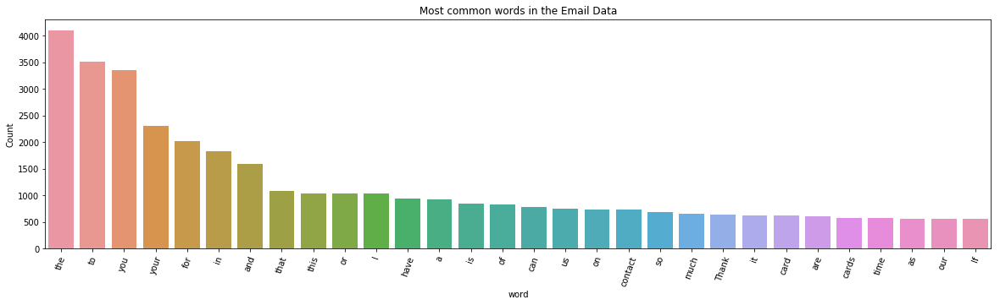

In [0]:
freq_words(test_data)

In [0]:
# remove unwanted characters, numbers and symbols
email_data = test_data.str.replace("[^a-zA-Z#]", " ")

In [0]:
email_data[:10]


0                                                                                      If you have further questions  suggestions for improvements or general comments  do not hesitate to contact me again 
1                                                                In the meantime  we sincerely apologize for the inconvenience this causes and hope that you can use   in its full functionality again soon 
2                                                                                   Alternatively  you can also disable the notification badge completely in your general system settings under             
3                                                                                             I can assure you that our developers are already aware of the problem and try to solve it as soon as possible 
4                     Unfortunately  the notification alert on the   app icon not disappearing even though all new offers in   have already been opened seems to be a bug on very fe

### **Let’s try to remove the stopwords and short words (<2 letters) from the sentences.**

In [0]:
from nltk.corpus import stopwords
stop_words = stopwords.words('english')

In [0]:
# function to remove stopwords
def remove_stopwords(rev):
    rev_new = " ".join([i for i in rev if i not in stop_words])
    return rev_new

# remove short words (length < 3)
email_data = email_data.apply(lambda x: ' '.join([w for w in x.split() if len(w)>2]))

# remove stopwords from the text
email_data = [remove_stopwords(r.split()) for r in email_data]

# make entire text lowercase
email_data = [r.lower() for r in email_data]

Let’s again plot the most frequent words and see if the more significant words have come out.

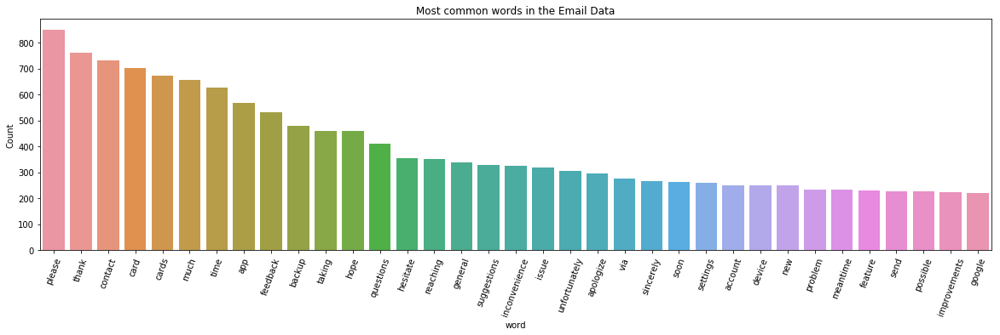

In [0]:
freq_words(email_data, 35)

We can see some improvement here. 

- To further remove noise from the text we can use lemmatization from the spaCy library. It reduces any given word to its base form thereby reducing multiple forms of a word to a single word.

In [0]:
!python -m spacy download en # one time run


    Linking successful
    /usr/local/lib/python3.6/dist-packages/en_core_web_sm -->
    /usr/local/lib/python3.6/dist-packages/spacy/data/en

    You can now load the model via spacy.load('en')



In [0]:
nlp = spacy.load('en', disable=['parser', 'ner'])

def lemmatization(texts, tags=['NOUN', 'ADJ']): # filter noun and adjective
       output = []
       for sent in texts:
             doc = nlp(" ".join(sent)) 
             output.append([token.lemma_ for token in doc if token.pos_ in tags])
       return output

***Let’s tokenize the email and then lemmatize the tokenized email***

In [0]:
tokenized_email = pd.Series(email_data).apply(lambda x: x.split())
print(tokenized_email[1])

['meantime', 'sincerely', 'apologize', 'inconvenience', 'causes', 'hope', 'use', 'full', 'functionality', 'soon']


In [0]:
email_2 = lemmatization(tokenized_email)
print(email_2[1]) # print lemmatized sentence


['inconvenience', 'cause', 'hope', 'full', 'functionality']


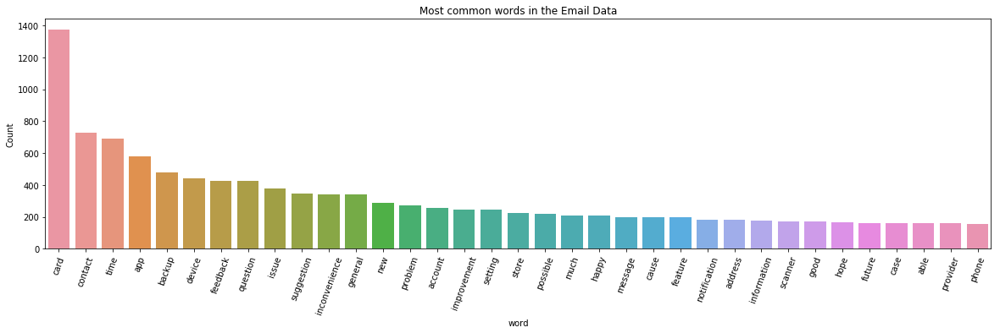

In [0]:
email_3 = []
for i in range(len(email_2)):
    email_3.append(' '.join(email_2[i]))

final_email_data = email_3

freq_words(final_email_data, 35)

It seems that now most frequent terms in our data are relevant. We can now go ahead and start building our topic model.



## Building an LDA model

In [0]:
dictionary = corpora.Dictionary(email_2)

In [0]:
doc_term_matrix = [dictionary.doc2bow(rev) for rev in email_2]

In [0]:
# Creating the object for LDA model using gensim library
LDA = gensim.models.ldamodel.LdaModel

# Build LDA model
lda_model = LDA(corpus=doc_term_matrix, id2word=dictionary, num_topics=7, random_state=100,
                chunksize=1000, passes=50)

/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

Let’s print out the topics that our LDA model has learned.

In [0]:
# lda_model.print_topics()


'''
For each topic, we will explore the words occuring in that topic and its relative weight
'''
for idx, topic in lda_model.print_topics(-1):
    print("Topic: {} \nWords: {}".format(idx, topic ))
    print("\n")

Topic: 0 
Words: 0.121*"question" + 0.116*"contact" + 0.097*"suggestion" + 0.072*"general" + 0.070*"improvement" + 0.066*"feedback" + 0.056*"device" + 0.036*"card" + 0.024*"response" + 0.019*"android"


Topic: 1 
Words: 0.080*"scanner" + 0.077*"information" + 0.037*"problem" + 0.037*"helpful" + 0.036*"store" + 0.032*"device" + 0.031*"system" + 0.029*"difficulty" + 0.028*"image" + 0.028*"app"


Topic: 2 
Words: 0.111*"card" + 0.048*"setting" + 0.041*"app" + 0.040*"notification" + 0.040*"new" + 0.025*"available" + 0.025*"catalogue" + 0.025*"offer" + 0.022*"loyalty" + 0.021*"section"


Topic: 3 
Words: 0.131*"inconvenience" + 0.079*"cause" + 0.077*"card" + 0.044*"hope" + 0.044*"able" + 0.040*"account" + 0.040*"future" + 0.026*"datum" + 0.025*"help" + 0.021*"password"


Topic: 4 
Words: 0.131*"card" + 0.039*"possible" + 0.039*"address" + 0.038*"facebook" + 0.037*"mail" + 0.029*"problem" + 0.028*"point" + 0.024*"afraid" + 0.022*"number" + 0.020*"user"


Topic: 5 
Words: 0.159*"time" + 0.093

- LDA model doesn’t give a topic name to those words and it is for us humans to interpret them. 

- Distinguish different topics using the words in each topic and their corresponding weights.

## Topics Visualization
To visualize our topics in a 2-dimensional space we will use the pyLDAvis library. This visualization is interactive in nature and displays topics along with the most relevant words.

In [0]:
# Visualize the topics
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, doc_term_matrix, dictionary)
vis

/usr/local/lib/python3.6/dist-packages/pyLDAvis/_prepare.py:257: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  return pd.concat([default_term_info] + list(topic_dfs))


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2      0.125054 -0.034856       1        1  17.278440
6      0.099943  0.050957       2        1  16.771379
4      0.158075  0.037095       3        1  15.832107
5     -0.302615  0.037475       4        1  15.275007
0     -0.161147  0.244489       5        1  14.241320
3      0.217397 -0.004736       6        1  10.827524
1     -0.136707 -0.330423       7        1   9.774224, topic_info=    Category         Freq           Term        Total  loglift  logprob
37   Default   649.000000           time   649.000000  30.0000  30.0000
63   Default   478.000000         backup   478.000000  29.0000  29.0000
1    Default   650.000000        contact   650.000000  28.0000  28.0000
4    Default   406.000000       question   406.000000  27.0000  27.0000
10   Default   336.000000  inconvenience   336.000000  26.0000  26.0000
45   Default  1330.000000           card  1330.000000  25.0000  25.0000
5    Default   328.000000     suggestion   328.000000  24.0000  24.0000
34   Default   335.000000          issue   335.000000  23.0000  23.0000
40   Default   411.000000       feedback   411.000000  22.0000  22.0000
3    Default   234.000000    improvement   234.000000  21.0000  21.0000
6    Default   201.000000          cause   201.000000  20.0000  20.0000
2    Default   319.000000        general   319.000000  19.0000  19.0000
305  Default   184.000000        scanner   184.000000  18.0000  18.0000
76   Default   179.000000    information   179.000000  17.0000  17.0000
59   Default   197.000000          happy   197.000000  16.0000  16.0000
36   Default   184.000000           much   184.000000  15.0000  15.0000
104  Default   208.000000        message   208.000000  14.0000  14.0000
62   Default   236.000000        account   236.000000  13.0000  13.0000
14   Default   239.000000        setting   239.000000  12.0000  12.0000
22   Default   557.000000            app   557.000000  11.0000  11.0000
24   Default   452.000000         device   452.000000  10.0000  10.0000
13   Default   164.000000   notification   164.000000   9.0000   9.0000
20   Default   258.000000        problem   258.000000   8.0000   8.0000
132  Default   142.000000       facebook   142.000000   7.0000   7.0000
19   Default   213.000000       possible   213.000000   6.0000   6.0000
82   Default   155.000000           able   155.000000   5.0000   5.0000
9    Default   154.000000           hope   154.000000   4.0000   4.0000
87   Default   139.000000           mail   139.000000   3.0000   3.0000
42   Default   158.000000         future   158.000000   2.0000   2.0000
83   Default   162.000000        address   162.000000   1.0000   1.0000
..       ...          ...            ...          ...      ...      ...
79    Topic7    16.784107        unusual    17.610439   2.2774  -4.9231
77    Topic7    14.255956         source    15.082528   2.2691  -5.0863
248   Topic7    13.843174        correct    14.670610   2.2674  -5.1157
168   Topic7    13.060750         useful    13.886934   2.2641  -5.1739
376   Topic7    13.048043       valuable    13.874249   2.2640  -5.1749
432   Topic7    12.571032           copy    13.398681   2.2617  -5.2121
75    Topic7    12.393700           hard    13.220208   2.2609  -5.2263
74    Topic7    11.395374         detect    12.221558   2.2554  -5.3103
474   Topic7     7.990666  differentiate     8.817249   2.2270  -5.6652
259   Topic7     7.986425          short     8.815865   2.2266  -5.6658
625   Topic7     7.923457           mile     8.749821   2.2262  -5.6737
569   Topic7     7.220020       outdated     8.046454   2.2170  -5.7666
299   Topic7     7.136480     membership     7.963946   2.2157  -5.7783
663   Topic7     7.045821          score     7.872095   2.2145  -5.7911
662   Topic7     7.045821         reload     7.872095   2.2145  -5.7911
675   Topic7     7.042466       download     7.869256   2.2144  -5.7915
568   Topic7   

So how to infer pyLDAvis’s output?

Each bubble on the left-hand side plot represents a topic. The larger the bubble, the more prevalent is that topic.

A good topic model will have fairly big, non-overlapping bubbles scattered throughout the chart instead of being clustered in one quadrant.

A model with too many topics, will typically have many overlaps, small sized bubbles clustered in one region of the chart.

Alright, if you move the cursor over one of the bubbles, the words and bars on the right-hand side will update. These words are the salient keywords that form the selected topic.

### (2.1) Let's perform the topic modeling for the summaries of emails

In [0]:
test_data2=e_data['email_summary']

In [0]:
test_data2.head()

0    Usually, the notification alert on the   app icon indicates that there are new flyers or catalogues available in your   section in   and should clear as soon as all notifications that are tagged a...
1    Usually, the notification alert on the   app icon indicates that there are new flyers or catalogues available in your   section in   and should clear as soon as all notifications that are tagged a...
2    Thank you for contacting us regarding this issue. I'm constantly trying to add your current points balance via is currently only available for selected cards and regions. Sorry, I can not speak Ja...
3    Thank you for contacting us regarding this issue. I'm constantly trying to add your current points balance via is currently only available for selected cards and regions. Sorry, I can not speak Ja...
4    I'm happy to hear that the issue got resolved after all and you can now use   in its full functionality again. Also many thanks for your suggestions. In case you experience an

In [0]:
email_data2 = test_data2.str.replace("[^a-zA-Z#]", " ")

In [0]:
email_data2[:10]


0    Usually  the notification alert on the   app icon indicates that there are new flyers or catalogues available in your   section in   and should clear as soon as all notifications that are tagged a...
1    Usually  the notification alert on the   app icon indicates that there are new flyers or catalogues available in your   section in   and should clear as soon as all notifications that are tagged a...
2    Thank you for contacting us regarding this issue  I m constantly trying to add your current points balance via is currently only available for selected cards and regions  Sorry  I can not speak Ja...
3    Thank you for contacting us regarding this issue  I m constantly trying to add your current points balance via is currently only available for selected cards and regions  Sorry  I can not speak Ja...
4    I m happy to hear that the issue got resolved after all and you can now use   in its full functionality again  Also many thanks for your suggestions  In case you experience an

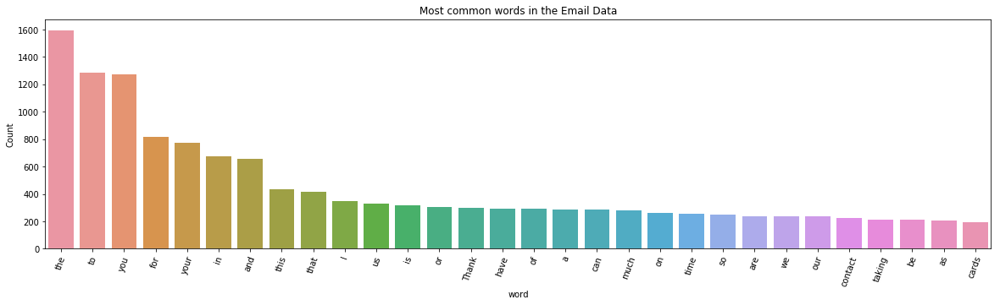

In [0]:
freq_words(test_data2)

Let’s try to remove the stopwords and short words (<2 letters) from the sentences

In [0]:
# function to remove stopwords
def remove_stopwords(rev):
    rev_new = " ".join([i for i in rev if i not in stop_words])
    return rev_new

# remove short words (length < 3)
email_data2 = email_data2.apply(lambda x: ' '.join([w for w in x.split() if len(w)>2]))

# remove stopwords from the text
email_data2 = [remove_stopwords(r.split()) for r in email_data2]

# make entire text lowercase
email_data2 = [r.lower() for r in email_data2]

Let’s again plot the most frequent words and see if the more significant words have come out.

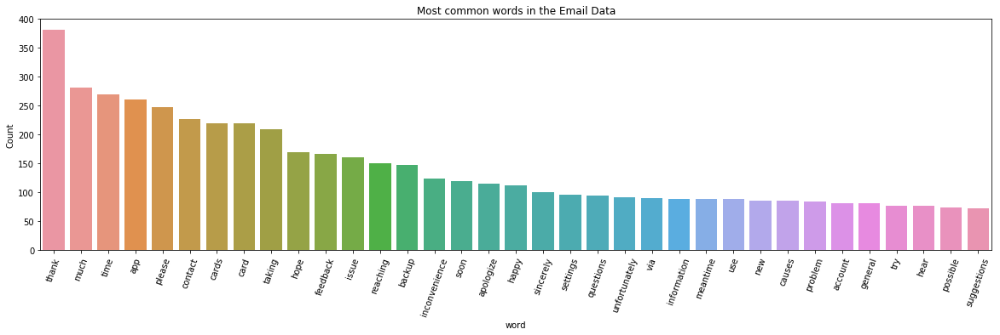

In [0]:
freq_words(email_data2, 35)

We can see some improvement here.

To further remove noise from the text we can use lemmatization from the spaCy library. It reduces any given word to its base form thereby reducing multiple forms of a word to a single word.

### Let’s tokenize the email and then lemmatize the tokenized email

In [0]:
tokenized_email2 = pd.Series(email_data2).apply(lambda x: x.split())
print(tokenized_email[1])

['meantime', 'sincerely', 'apologize', 'inconvenience', 'causes', 'hope', 'use', 'full', 'functionality', 'soon']


In [0]:
email_22 = lemmatization(tokenized_email2)
print(email_22[1]) # print lemmatized sentence

['notification', 'alert', 'app', 'icon', 'new', 'flyer', 'catalogue', 'available', 'section', 'clear', 'notification', 'purtroppo', 'non', 'parlo', 'italiano', 'spero', 'vada', 'bene', 'stesso', 'rispondo', 'inglese', 'time', 'contact', 'issue', 'assure', 'developer', 'aware', 'problem', 'possible']


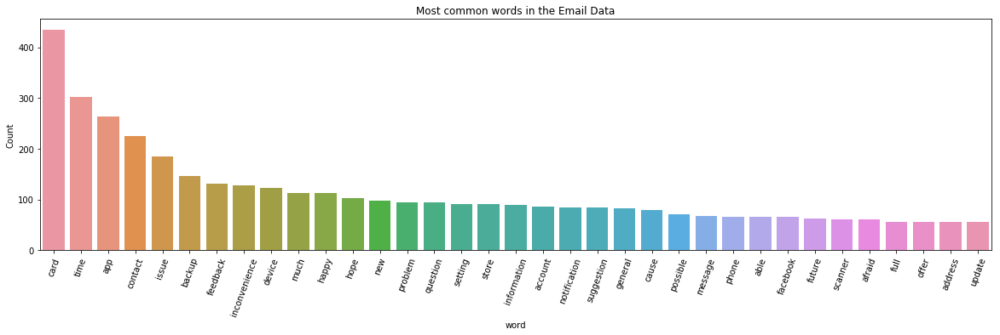

In [0]:
email_32 = []
for i in range(len(email_22)):
    email_32.append(' '.join(email_22[i]))

final_email_data_2 = email_32

freq_words(final_email_data_2, 35)

It seems that now most frequent terms in our data are relevant. We can now go ahead and start building our topic model.

### Building an LDA model

In [0]:
dictionary2 = corpora.Dictionary(email_22)

In [0]:
doc_term_matrix2 = [dictionary2.doc2bow(rev) for rev in email_22]

In [0]:
# Creating the object for LDA model using gensim library
LDA = gensim.models.ldamodel.LdaModel

# Build LDA model
lda_model2 = LDA(corpus=doc_term_matrix2, id2word=dictionary2, num_topics=7, random_state=100,
                chunksize=1000, passes=50)

/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

Let’s print out the topics that our LDA model has learned

In [0]:

'''
For each topic, we will explore the words occuring in that topic and its relative weight
'''
for idx, topic in lda_model2.print_topics(-1):
    print("Topic: {} \nWords: {}".format(idx, topic ))
    print("\n")

Topic: 0 
Words: 0.065*"happy" + 0.062*"app" + 0.061*"much" + 0.057*"time" + 0.048*"issue" + 0.036*"contact" + 0.025*"problem" + 0.025*"feedback" + 0.023*"device" + 0.022*"hear"


Topic: 1 
Words: 0.109*"card" + 0.041*"time" + 0.027*"scanner" + 0.026*"issue" + 0.024*"store" + 0.022*"inconvenience" + 0.021*"contact" + 0.018*"point" + 0.017*"scanning" + 0.017*"cause"


Topic: 2 
Words: 0.052*"day" + 0.047*"time" + 0.039*"application" + 0.026*"update" + 0.026*"contact" + 0.025*"app" + 0.025*"message" + 0.024*"user" + 0.024*"developer" + 0.024*"friend"


Topic: 3 
Words: 0.083*"card" + 0.033*"facebook" + 0.022*"dat" + 0.022*"het" + 0.017*"account" + 0.016*"issue" + 0.016*"icon" + 0.014*"app" + 0.013*"delete" + 0.012*"time"


Topic: 4 
Words: 0.058*"app" + 0.055*"notification" + 0.053*"setting" + 0.035*"offer" + 0.025*"card" + 0.025*"iphone" + 0.024*"system" + 0.024*"new" + 0.023*"open" + 0.021*"touch"


Topic: 5 
Words: 0.085*"backup" + 0.045*"device" + 0.038*"account" + 0.034*"card" + 0.0

LDA model doesn’t give a topic name to those words and it is for us humans to interpret them. 

## Topics Visualization


Now that the LDA model is built, the next step is to examine the produced topics and the associated keywords. There is no better tool than pyLDAvis package’s interactive chart and is designed to work well with jupyter notebooks.

- This visualization is interactive in nature and displays topics along with the most relevant words.

In [0]:
# Visualize the topics
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model2, doc_term_matrix2, dictionary2)
vis

/usr/local/lib/python3.6/dist-packages/pyLDAvis/_prepare.py:257: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  return pd.concat([default_term_info] + list(topic_dfs))


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1     -0.010649 -0.116381       1        1  20.181587
5      0.061245  0.132145       2        1  16.757713
6     -0.092500 -0.099176       3        1  16.653427
3      0.184117  0.108260       4        1  15.062310
4      0.160412 -0.145210       5        1  12.668530
0     -0.165898 -0.044963       6        1  12.152426
2     -0.136727  0.165326       7        1   6.524005, topic_info=    Category        Freq           Term       Total  loglift  logprob
49   Default  136.000000         backup  136.000000  30.0000  30.0000
29   Default  404.000000           card  404.000000  29.0000  29.0000
40   Default  102.000000          happy  102.000000  28.0000  28.0000
17   Default   80.000000   notification   80.000000  27.0000  27.0000
138  Default   85.000000        setting   85.000000  26.0000  26.0000
61   Default  103.000000           much  103.000000  25.0000  25.0000
43   Default   79.000000     suggestion   79.000000  24.0000  24.0000
71   Default   87.000000       question   87.000000  23.0000  23.0000
47   Default   80.000000        account   80.000000  22.0000  22.0000
114  Default  114.000000         device  114.000000  21.0000  21.0000
73   Default   30.000000            day   30.000000  20.0000  20.0000
1    Default  243.000000            app  243.000000  19.0000  19.0000
92   Default   61.000000       facebook   61.000000  18.0000  18.0000
32   Default  122.000000       feedback  122.000000  17.0000  17.0000
62   Default   53.000000          offer   53.000000  16.0000  16.0000
26   Default  277.000000           time  277.000000  15.0000  15.0000
68   Default   45.000000    improvement   45.000000  14.0000  14.0000
8    Default  207.000000        contact  207.000000  13.0000  13.0000
72   Default   34.000000    application   34.000000  12.0000  12.0000
144  Default   50.000000         update   50.000000  11.0000  11.0000
66   Default   76.000000        general   76.000000  10.0000  10.0000
13   Default  171.000000          issue  171.000000   9.0000   9.0000
9    Default   39.000000      developer   39.000000   8.0000   8.0000
218  Default   57.000000        scanner   57.000000   7.0000   7.0000
101  Default  119.000000  inconvenience  119.000000   6.0000   6.0000
104  Default   75.000000          cause   75.000000   5.0000   5.0000
139  Default   45.000000         system   45.000000   4.0000   4.0000
135  Default   28.000000         iphone   28.000000   3.0000   3.0000
48   Default   51.000000        address   51.000000   2.0000   2.0000
186  Default   30.000000            dat   30.000000   1.0000   1.0000
..       ...         ...            ...         ...      ...      ...
72    Topic7   22.911612    application   34.921757   2.3082  -3.2338
76    Topic7   13.802265         friend   23.346706   2.2041  -3.7406
660   Topic7    1.002822         secure    1.795654   2.1471  -6.3627
180   Topic7    1.002822       ricardol    1.795654   2.1471  -6.3627
653   Topic7    1.002822      authority    1.795654   2.1471  -6.3627
77    Topic7   12.815053           good   24.157387   2.0957  -3.8149
661   Topic7    1.002822      technique    1.795654   2.1471  -6.3627
178   Topic7    9.103493          datum   17.118477   2.0982  -4.1568
74    Topic7    7.146433            end   13.516098   2.0924  -4.3989
106   Topic7   12.394230        loading   24.342640   2.0547  -3.8482
83    Topic7   13.978846           user   29.847435   1.9711  -3.7279
75    Topic7   13.536150           free   37.323990   1.7154  -3.7601
9     Topic7   13.895269      developer   39.163658   1.6935  -3.7339
144   Topic7   15.350329         update   50.310123   1.5426  -3.6343
79    Topic7    9.391420          order   29.147524   1.5971  -4.1257
121   Topic7    4.514134        comment    9.955339   1.9388  -4.8583
116   Topic7    6.122728            map   16.370104   1.7462  -4.5535
110   Topic7   14.337688        message  

So how to infer pyLDAvis’s output?

Each bubble on the left-hand side plot represents a topic. The larger the bubble, the more prevalent is that topic.

A good topic model will have fairly big, non-overlapping bubbles scattered throughout the chart instead of being clustered in one quadrant.

A model with too many topics, will typically have many overlaps, small sized bubbles clustered in one region of the chart.

Alright, if you move the cursor over one of the bubbles, the words and bars on the right-hand side will update. These words are the salient keywords that form the selected topic.

****With due respect****

Sir if my work is not up to the mark then please let me know what wrong I did. So I can learn more and improve my self further.

**Thanks Jatana for giving me such a nice project to work on **

***“I look forward to hearing from you.”***